# Exploring example graphs
In this notebook you can load in the datasets discussed in the lecture and calculate their metrics yourself. The larger graphs are subset so they can be worked with easily. You can change the `num_nodes` variable in each block to change the size the graph is subset to.

Once a graph is loaded in, you can calculate additional statistics with it. The igraph website lists all the available functions: https://igraph.org/python/doc/api/igraph.Graph.html

In [14]:
import igraph as ig
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import random
import warnings
warnings.filterwarnings("ignore")
matplotlib.rcParams.update({'font.size': 14})

## Functions used in notebook

In [6]:
def get_edge_vert(df):
    """Print the number of vertices and edges given dataframe"""
    num_vertices = len(set(df["v1"].unique()).union(df["v2"].unique()))
    num_edges = df.shape[0]
    print("vertices: {:,}, edges: {:,}".format(num_vertices, num_edges))

In [7]:
def num_comp(g):
    """Print the number of compartments given a graph"""
    return (len(set(g.clusters().membership)))

In [8]:
def summarize_graph(g):
    """Calculate various statistics given a graph"""
    print("num vertices: {:,}".format(g.vcount()))
    print("num edges: {:,}".format(g.ecount()))
    print("diameter: {:,}".format(g.diameter()))
    print("density: {:0.3f}".format(g.density()))
    print("compartments: {}".format(num_comp(g)))
    # girth: length of shortest cycle
    print("girth: {:,}".format(g.girth()))
    
    # pearson correlation coefficient of degree between pairs of linked nodes
    print("assortativity: {:0.3f}".format(g.assortativity_degree()))
    

In [9]:
def plot_degree(g,name):
    """Plot the degree distribution of a graph"""
    plt.hist(g.degree())
    plt.title("{}\nDegree of vertices\nmax: {:,}, min: {:,}, median: {:,}".format(name,max(g.degree()), min(g.degree()), int(np.median(g.degree()))))
    plt.savefig("images/degree_{}.png".format(name),bbox_inches="tight")
    plt.show()

In [10]:
def plot_comp(g,name):
    """Plot compartment distribution of a graph"""
    comp_vec = g.clusters().membership
    comps = np.unique(comp_vec)
    comp_sizes = []
    for c in comps:
        comp_sizes.append(comp_vec.count(c))
    plt.hist(comp_sizes)
    plt.title("{}\nSize of components\nmax: {:,}, min: {:,}, median: {:,}".format(name,max(comp_sizes), min(comp_sizes), int(np.median(comp_sizes))))
    plt.savefig("images/comp_{}.png".format(name),bbox_inches="tight")
    plt.show()

## Twitter
Dataset downloaded from https://snap.stanford.edu/data/ego-Twitter.html

num vertices: 193
num edges: 7,597
diameter: 4
density: 0.410
compartments: 2
girth: 3
assortativity: -0.034


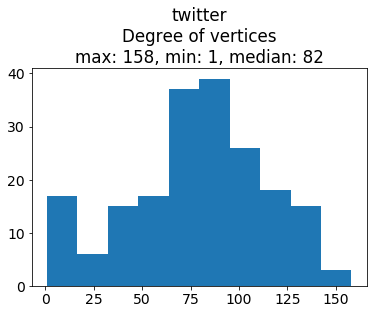

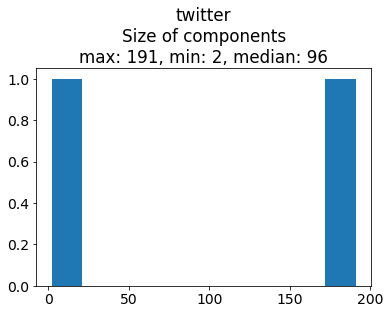

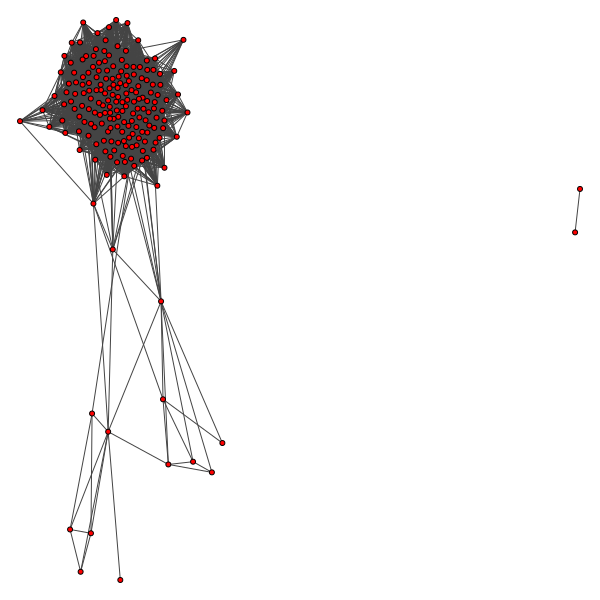

In [11]:
name = "twitter"
sub = pd.read_csv("data/twitter/16987303.edges",sep=" ", names=["v1","v2"])
sub["max"] = sub.max(axis=1)
sub["min"] = sub.min(axis=1)
sub.drop_duplicates(["max","min"],inplace=True)
num_nodes = sub["v1"].max()
g = ig.Graph.DataFrame(sub,directed=False)

summarize_graph(g)

plot_degree(g,name)
plot_comp(g,name)

random.seed(123)
ig.plot(g,"images/{}_{}.png".format(name,num_nodes),vertex_size=5)

## Facebook
Dataset downloaded from https://snap.stanford.edu/data/ego-Facebook.html

num vertices: 747
num edges: 30,025
diameter: 7
density: 0.108
compartments: 2
girth: 3
assortativity: 0.503


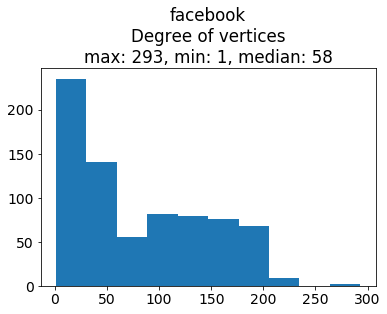

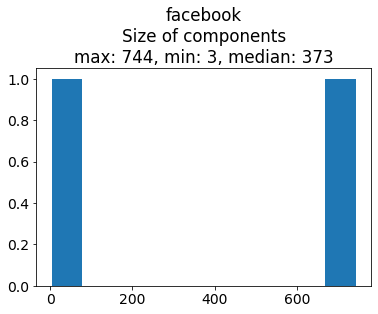

In [12]:
sub = pd.read_csv("data/facebook/1912.edges",sep=" ", names=["v1","v2"])
name = "facebook"
sub["max"] = sub.max(axis=1)
sub["min"] = sub.min(axis=1)
sub.drop_duplicates(["max","min"],inplace=True)
num_nodes = sub["v1"].max()
g = ig.Graph.DataFrame(sub,directed=False)

summarize_graph(g)

plot_degree(g,name)
plot_comp(g,name)

random.seed(123)
ig.plot(g,"images/{}_{}.png".format(name,num_nodes),vertex_size=5)

## MovieLens
Dataset downloaded from https://www.kaggle.com/grouplens/movielens-20m-dataset

num vertices: 670
num edges: 977
diameter: 7
density: 0.004
compartments: 6
girth: 4
assortativity: -0.407


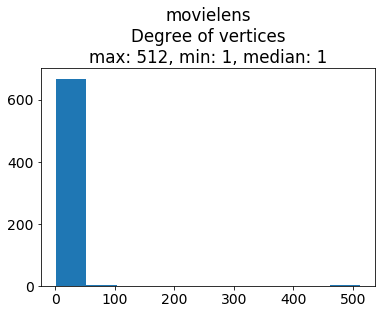

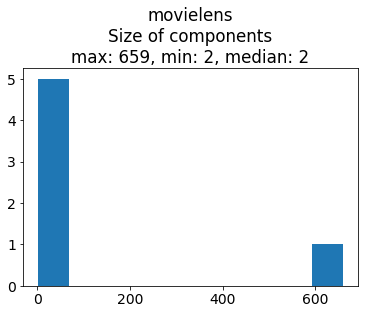

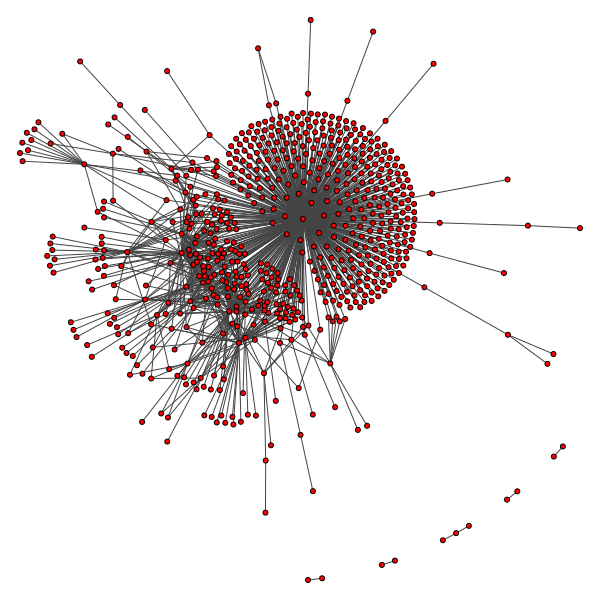

In [15]:
movielens = pd.read_csv("data/archive/tag.csv",sep=",",skiprows=1,names=["v1","v2","tag","timestamp"])
movielens = movielens.drop_duplicates(["v1","v2"])
num_nodes = 2000
name = "movielens"
sub = movielens[(movielens["v1"] < num_nodes) & (movielens["v2"] < num_nodes)]
sub["v1"] = "user" + sub["v1"].astype(str)
sub["v2"] = "movie" + sub["v2"].astype(str)
movielens["v1"] = "user" + movielens["v1"].astype(str)
movielens["v2"] = "movie" + movielens["v2"].astype(str)
g = ig.Graph.DataFrame(sub,directed=False)
summarize_graph(g)

plot_degree(g,name)
plot_comp(g,name)

random.seed(123)
ig.plot(g,"images/{}_{}.png".format(name,num_nodes),vertex_size=5)

## Mouse 
Data downloaded from https://networkrepository.com/bio-mouse-gene.php

num vertices: 400
num edges: 4,584
diameter: 7
density: 0.057
compartments: 2
girth: 3
assortativity: -0.350


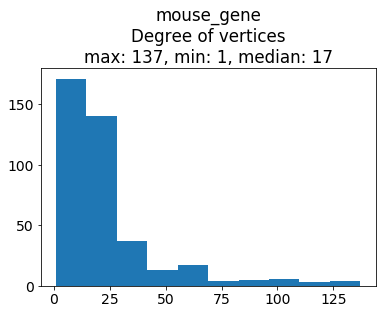

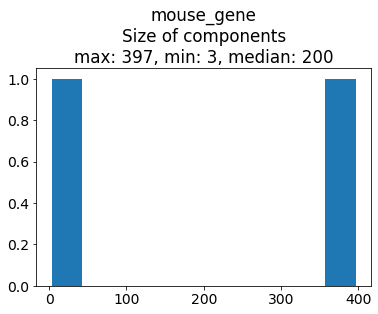

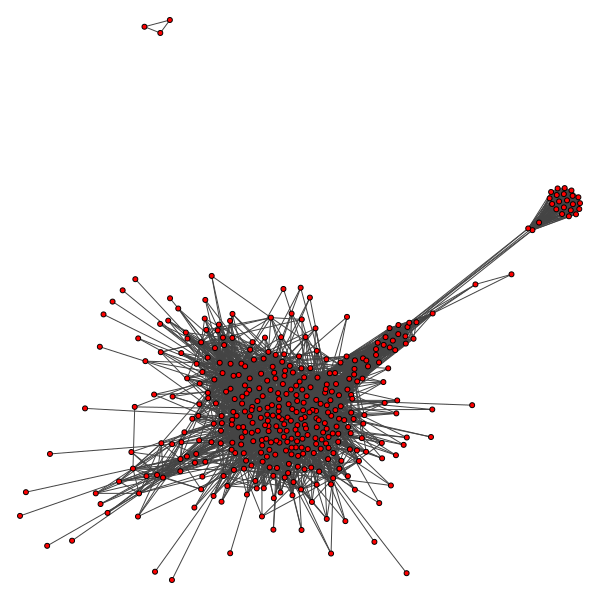

In [16]:
name = "mouse_gene"

# CHANGE to subset to different number of vertices
num_nodes = 500

mouse = pd.read_csv("data/bio-mouse-gene/bio-mouse-gene_small.edges",sep=" ",skiprows=3,names=["v1","v2","weight"])

# Remove loops
mouse = mouse[mouse["v1"] != mouse["v2"]]


sub = mouse[(mouse["v1"] < num_nodes) & (mouse["v2"] < num_nodes)]
g = ig.Graph.DataFrame(sub,directed=False)

summarize_graph(g)
plot_degree(g,name)
plot_comp(g,name)
random.seed(123)
ig.plot(g,"images/{}_{}.png".format(name,num_nodes),vertex_size=5)

## Berkeley Stanford 
Data downloaded from https://snap.stanford.edu/data/web-BerkStan.html

num vertices: 499
num edges: 1,304
diameter: 6
density: 0.010
compartments: 3
girth: 3
assortativity: -0.165


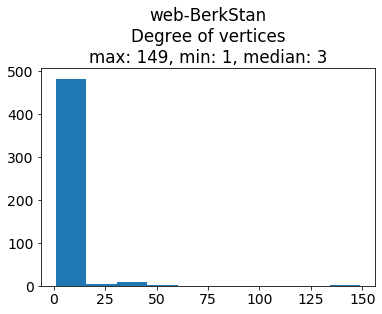

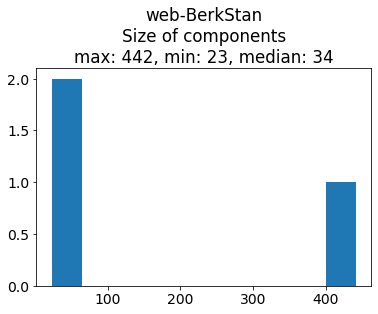

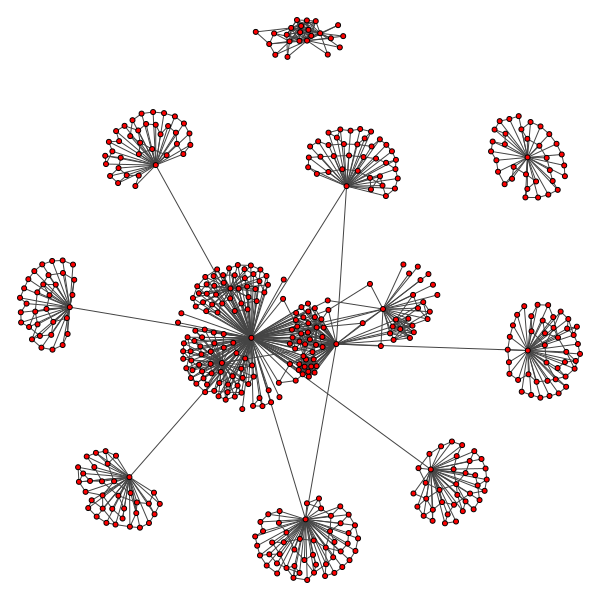

In [20]:
name = "web-BerkStan"

# CHANGE to subset to different number of vertices
num_nodes = 500

berkstan = pd.read_csv("data/web-BerkStan_small.txt",sep="\t",skiprows=4,names=["v1","v2"])
berkstan["max"] = berkstan.max(axis=1)
berkstan["min"] = berkstan.min(axis=1)
berkstan.drop_duplicates(["max","min"],inplace=True)
sub = berkstan[(berkstan["v1"] < num_nodes) & (berkstan["v2"] < num_nodes)]
g = ig.Graph.DataFrame(sub,directed=False)
summarize_graph(g)
plot_degree(g,name)
plot_comp(g,name)

random.seed(123)
ig.plot(g,"images/{}_{}.png".format(name,num_nodes),vertex_size=5)